In [1]:
import os

import matplotlib as mpl
import numpy as np
import pandas as pd
import seaborn as sns
import simplstyles
from himalaya.backend import set_backend
from matplotlib import pyplot as plt
from voxelwise_tutorials.io import load_hdf5_array
from voxelwise_tutorials.viz import plot_flatmap_from_mapper, plot_2d_flatmap_from_mapper

from compare_variance_residual.fmri.features import get_pretty_feature_name
from compare_variance_residual.fmri.results import get_result_path

In [2]:
plt.style.use('nord-light-talk')
data_dir = "../../data"
backend = set_backend('torch_cuda', on_error='warn')
simplstyles.styles['nord-light-talk']

/home/leo/PycharmProjects/compare_variance_residual/venv/lib/python3.12/site-packages/himalaya/backend/_utils.py:55: UserWarning: Setting backend to torch_cuda failed: PyTorch not installed..Falling back to numpy backend.
  warnings.warn(f"Setting backend to {backend} failed: {str(error)}."


RcParams({'axes.axisbelow': True,
          'axes.edgecolor': '#abb9cf',
          'axes.facecolor': 'white',
          'axes.grid': False,
          'axes.labelcolor': '#434c5e',
          'axes.labelsize': 18.0,
          'axes.linewidth': 1.25,
          'axes.prop_cycle': cycler('color', ['#5e81ac', '#88c0d0', '#d08770', '#bf616a', '#b48ead', '#a3be8c', '#ebcb8b', '#abb9cf']),
          'axes.spines.right': False,
          'axes.spines.top': False,
          'axes.titlelocation': 'left',
          'axes.titlesize': 18.0,
          'axes.titleweight': 'bold',
          'boxplot.showbox': False,
          'boxplot.showcaps': False,
          'boxplot.showfliers': False,
          'figure.facecolor': 'white',
          'font.family': ['sans-serif'],
          'font.sans-serif': ['Inter',
                              'Helvetica',
                              'Arial',
                              'DejaVu Sans',
                              'Bitstream Vera Sans',
                   

In [3]:
subject = 5
modality = "reading"
low_level_feature = "letters"

In [4]:
mapper_path = os.path.join("../../data", 'mappers', f"subject{subject:02}_mappers.hdf")
mapper = load_hdf5_array(mapper_path)
flatmap_mask = mapper['flatmap_mask']

# Load EV

In [5]:
ev_path = os.path.join(get_result_path(modality, subject), 'ev.csv')
ev = pd.read_csv(ev_path)
ev.describe()

,# ev
count,80249.000000
mean,0.058670
std,0.097017
min,-0.289520
25%,-0.006331
50%,0.046185
75%,0.108376
max,0.622027


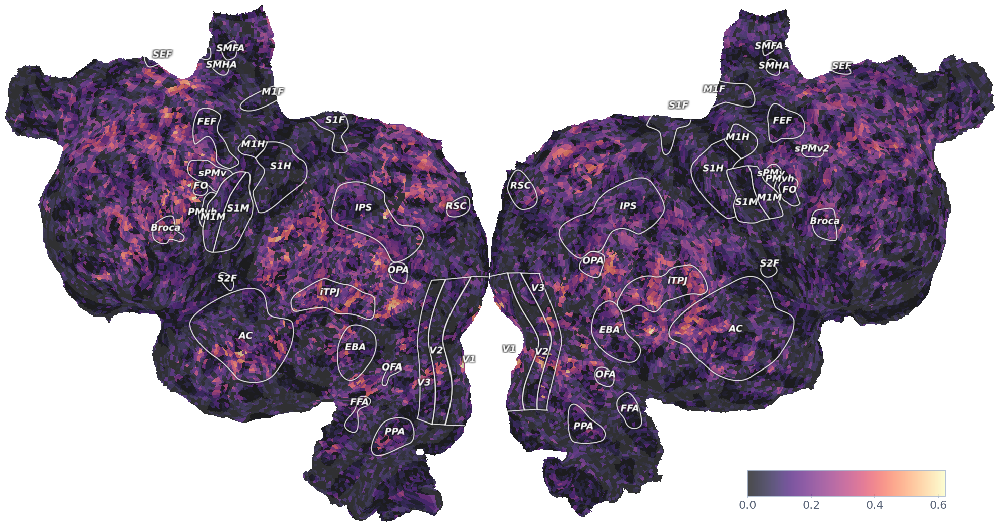

In [6]:
plot_flatmap_from_mapper(ev, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(ev), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

<Axes: >

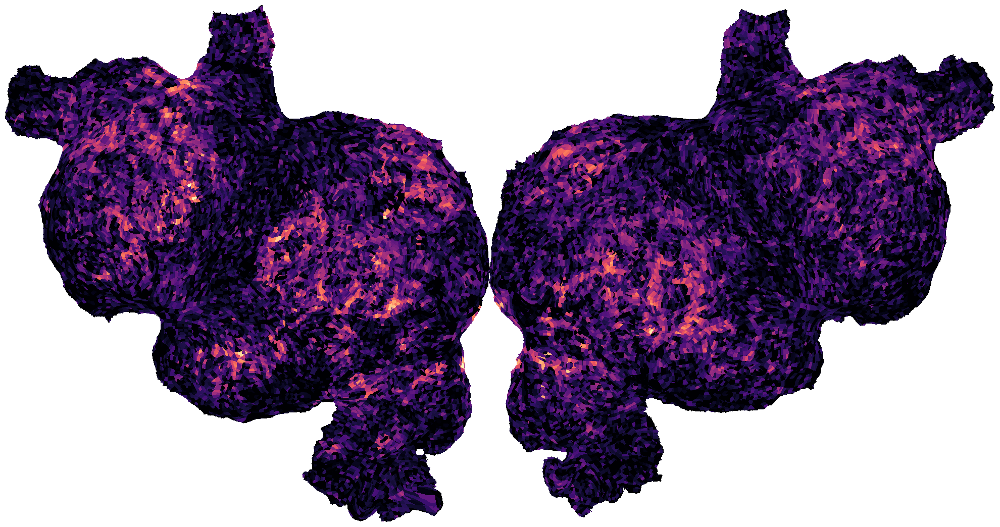

In [7]:
plot_flatmap_from_mapper(ev, mapper_path, with_curvature=False, vmin=0,
                         vmax=np.max(ev), cmap='magma', with_colorbar=False, with_rois=False, alpha=1)

# Variance Partitioning

## Low Level Prediction

In [8]:
low_level_file = os.path.join(get_result_path(modality, subject), f"{low_level_feature}_scores.csv")

In [9]:
print(f"Loading {low_level_file}")
low_level_scores = pd.read_csv(low_level_file)
low_level_scores.describe()

Loading results/reading/subject05/letters_scores.csv


,correlation_score,r2_score,p_value
count,80249.000000,8.061500e+04,8.024900e+04
mean,0.046097,3.461948e-03,3.950969e-01
std,0.081678,1.628748e-02,3.118147e-01
min,-0.259725,-7.958305e-02,1.206141e-31
25%,-0.007830,-1.192093e-07,9.908528e-02
50%,0.039462,1.192093e-07,3.490795e-01
75%,0.091414,2.506673e-03,6.617112e-01
max,0.614827,3.779662e-01,9.999906e-01


In [10]:
low_level_correlation = low_level_scores['correlation_score']
low_level_correlation = low_level_correlation.to_numpy()
low_level_correlation = np.nan_to_num(low_level_correlation)

# significant_voxels = [True if p_value < 0.05 else False for p_value in low_level_scores['p_value']]
# masked_correlation = np.full(low_level_correlation.shape, np.nan)
# # set values to nan, if not significant
# masked_correlation[significant_voxels] = low_level_correlation[significant_voxels]

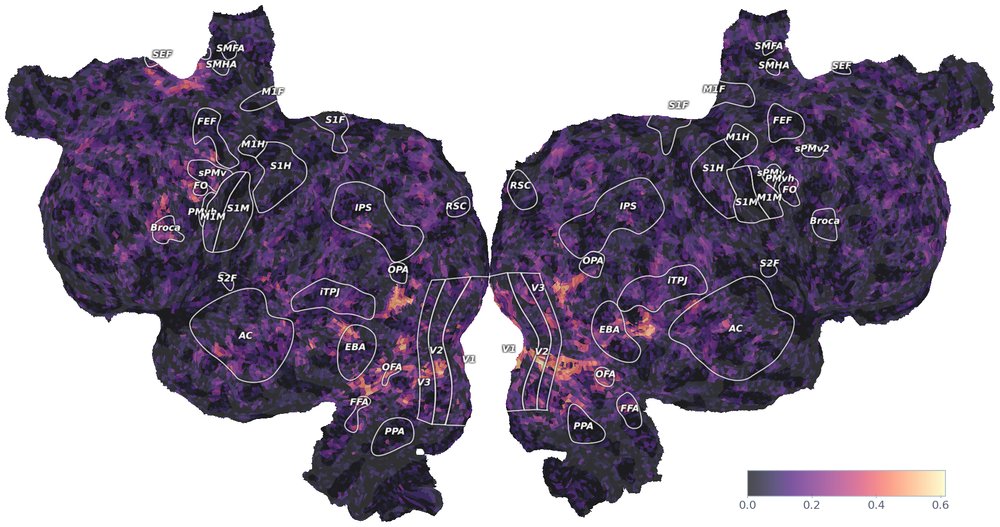

In [11]:
plot_flatmap_from_mapper(low_level_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(low_level_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

## Semantic Prediction

In [12]:
semantic_file = os.path.join(get_result_path(modality, subject), f"english1000_scores.csv")

In [13]:
semantic_scores = pd.read_csv(semantic_file)
semantic_scores.describe()

,correlation_score,r2_score,p_value
count,80249.000000,8.061500e+04,8.024900e+04
mean,0.050896,5.929404e-03,3.821684e-01
std,0.093111,2.140350e-02,3.156566e-01
min,-0.295883,-1.116160e-01,4.339698e-29
25%,-0.011188,-7.605553e-05,7.623264e-02
50%,0.038809,1.192093e-07,3.318328e-01
75%,0.097161,3.562719e-03,6.541624e-01
max,0.593558,3.331026e-01,9.999978e-01


In [14]:
semantic_correlation = semantic_scores['correlation_score']
semantic_correlation = semantic_correlation.to_numpy()
semantic_correlation = np.nan_to_num(semantic_correlation)
vmax = semantic_correlation.max()
print(vmax)

0.5935575117397555


Text(0.0, 1.0, 'Prediction Accuracy ($\\rho$)')

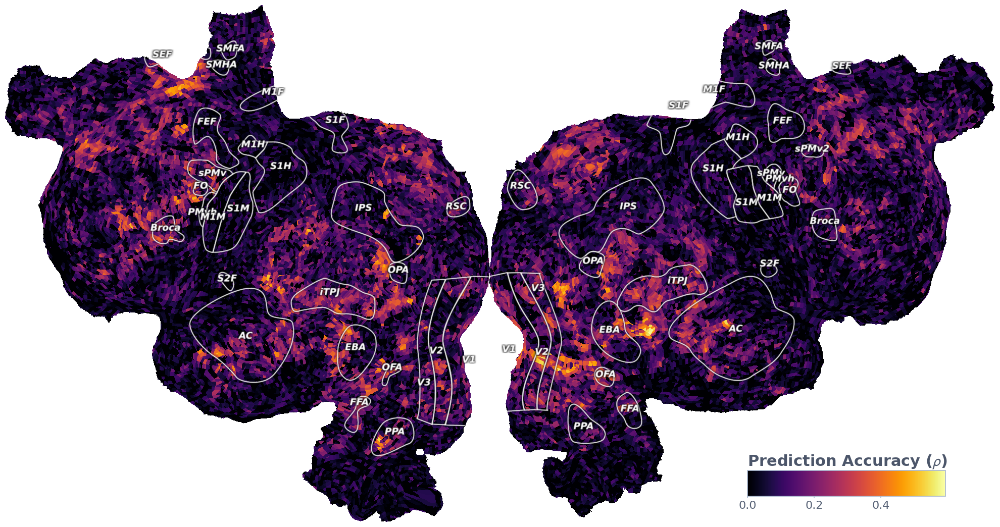

In [15]:
plot_flatmap_from_mapper(semantic_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=vmax, colorbar_location=[0.75, 0.05, 0.2, 0.05], alpha=1)
children = plt.gca().get_children()
cbar = children[12]
cbar.set_title(r"Prediction Accuracy ($\rho$)", fontsize=22)

## Joint Prediction

In [16]:
joint_file = os.path.join(get_result_path(modality, subject), f"joint_english1000_{low_level_feature}_scores.csv")

In [17]:
joint_scores = pd.read_csv(joint_file)
joint_scores.describe()

,correlation_score,r2_score,p_value
count,80249.000000,8.061500e+04,8.024900e+04
mean,0.052088,6.390448e-03,3.800779e-01
std,0.094258,2.217866e-02,3.161986e-01
min,-0.297086,-1.006970e-01,4.339935e-29
25%,-0.010669,-1.678467e-04,7.326184e-02
50%,0.039487,1.192093e-07,3.284871e-01
75%,0.098556,4.758328e-03,6.525771e-01
max,0.593557,3.379347e-01,9.999793e-01


In [18]:
joint_correlation = joint_scores['correlation_score']
joint_correlation = joint_correlation.to_numpy()
joint_correlation = np.nan_to_num(joint_correlation)

significant_voxels = [True if p_value < 0.05 else False for p_value in joint_scores['p_value']]
masked_correlation = np.full(joint_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[significant_voxels] = joint_correlation[significant_voxels]

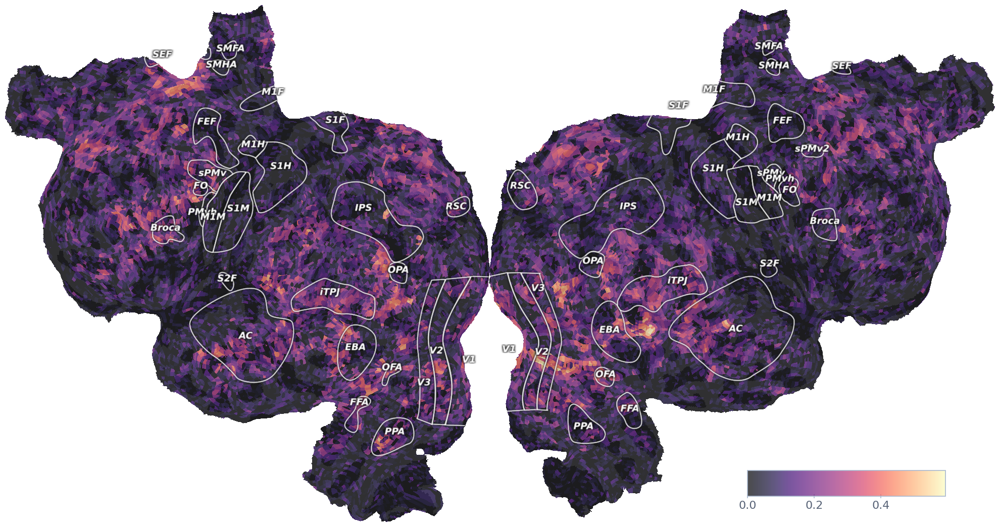

In [19]:
plot_flatmap_from_mapper(joint_correlation, mapper_path, vmin=0,
                         vmax=np.max(joint_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')

plt.show()

In [20]:
vp_path = os.path.join(get_result_path(modality, subject), f"vp_english1000_{low_level_feature}_scores.csv")

In [21]:
vp_scores = pd.read_csv(vp_path)
vp_scores.describe()

,semantic\letters,joint\letters,semantic\letters_r2,joint\letters_r2
count,80249.000000,80249.000000,8.061500e+04,80615.000000
mean,0.009710,0.009710,3.000904e-03,0.002928
std,0.098439,0.098439,1.559852e-02,0.016904
min,-0.393591,-0.393591,-8.943141e-02,-0.135043
25%,-0.063877,-0.063877,-5.928874e-04,-0.002026
50%,0.011647,0.011647,1.192093e-07,0.000000
75%,0.073060,0.073060,2.759159e-03,0.003345
max,0.520083,0.520083,3.433486e-01,0.231197


In [22]:
vp_correlation = vp_scores[f'semantic\\{low_level_feature}']
vp_correlation = np.array(vp_correlation)
# vp_correlation = semantic_minus_low_level

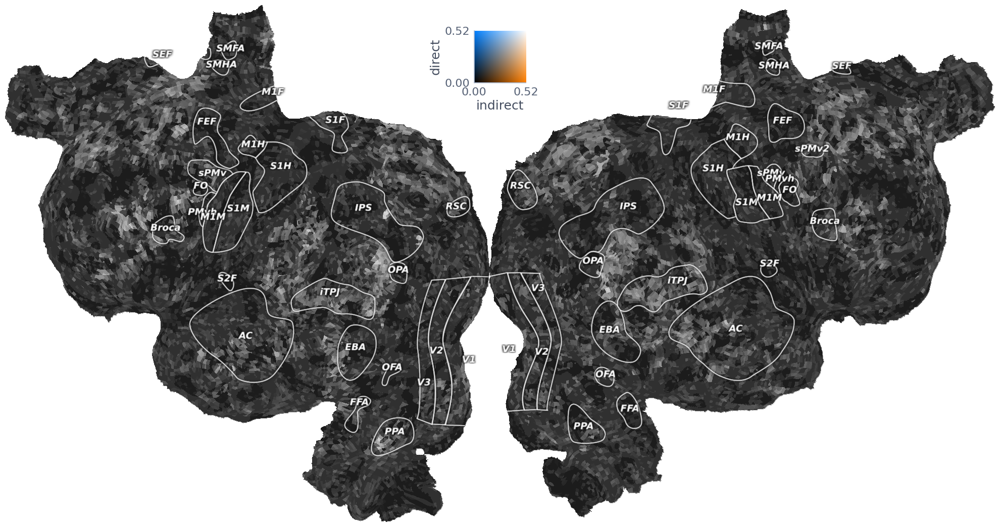

In [23]:
indirect = vp_scores[f'semantic\\{low_level_feature}']
direct = vp_scores[f'joint\\{low_level_feature}']
vmax = max(indirect.max(), direct.max())

plot_2d_flatmap_from_mapper(indirect, direct, mapper_path, vmin=0, vmin2=0, vmax=vmax, vmax2=vmax, label_1="indirect",
                            label_2='direct')
plt.show()

<Axes: >

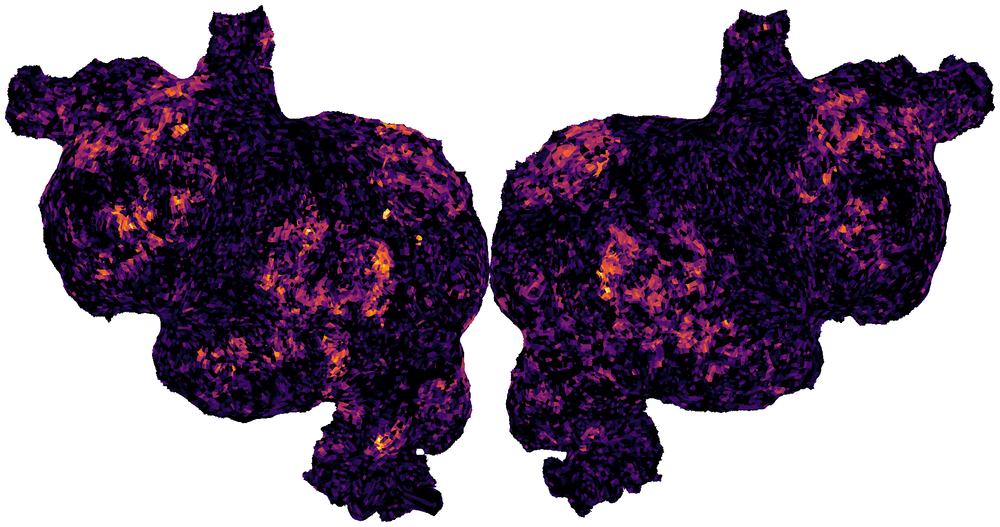

In [24]:
# fig, ax = plt.subplots()
plot_flatmap_from_mapper(np.array(direct), mapper_path, with_curvature=True, vmin=0,
                         vmax=vmax, with_colorbar=False, with_rois=False, alpha=1)
# ax.set_axis_off()

# Residual Method

In [25]:
cross_path = os.path.join(get_result_path(modality, subject), f"cross_{low_level_feature}_english1000_scores.csv")
cross_ridge_path = os.path.join(get_result_path(modality, subject),
                                f"cross_ridge_{low_level_feature}_english1000_scores.csv")

In [26]:
r2_scores = np.array(pd.read_csv(cross_path))
r2_scores_ridge = np.array(pd.read_csv(cross_ridge_path))

<Axes: ylabel='Count'>

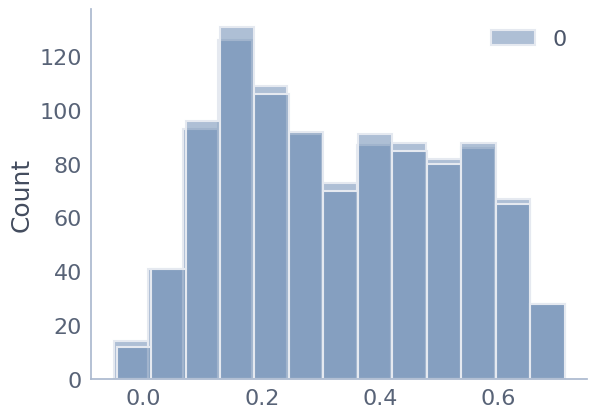

In [27]:
sns.histplot(r2_scores, label="OLS")
sns.histplot(r2_scores_ridge, label="Ridge")

In [28]:
means = [r2_scores.mean(), r2_scores_ridge.mean()]

Text(0.0, 1.0, 'Letters')

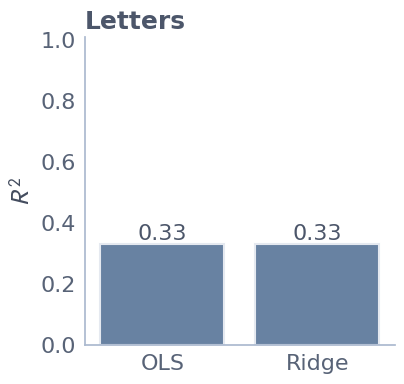

In [29]:
plt.subplots(figsize=(4, 4))
ax = sns.barplot(x=["OLS", "Ridge"], y=means)
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f')
plt.ylim([0, 1.01])

plt.ylabel(r"$R^2$")
plt.title(get_pretty_feature_name(low_level_feature))

## Residuals

### OLS

In [30]:
residual_file = os.path.join(get_result_path(modality, subject), f"residual_{low_level_feature}_english1000_scores.csv")

In [31]:
residual_scores = pd.read_csv(residual_file)
residual_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,80615.000000,80249.000000,80615.000000,8.024900e+04
mean,40307.000000,0.026267,0.002118,4.278708e-01
std,23271.690312,0.083454,0.014480,3.104586e-01
min,0.000000,-0.282429,-0.096026,9.536985e-24
25%,20153.500000,-0.028630,-0.000676,1.388303e-01
50%,40307.000000,0.018069,0.000000,4.038892e-01
75%,60460.500000,0.069517,0.000990,6.962597e-01
max,80614.000000,0.543310,0.207612,9.999907e-01


In [32]:
residual_correlation = residual_scores['correlation_score']
residual_correlation = residual_correlation.to_numpy()
residual_correlation = np.nan_to_num(residual_correlation)

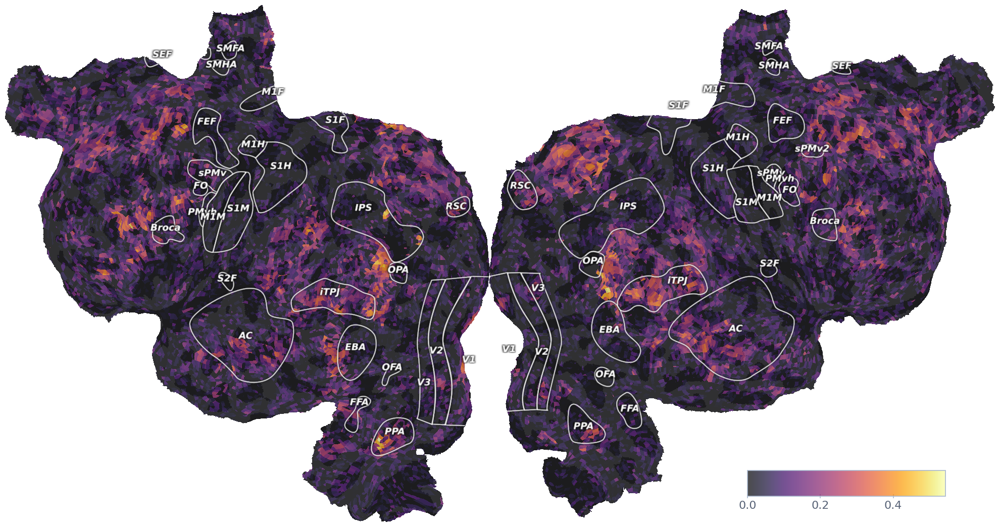

In [33]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

### Ridge

In [34]:
residual_ridge_file = os.path.join(get_result_path(modality, subject),
                                   f"residual_ridge_{low_level_feature}_english1000_scores.csv")

In [35]:
residual_ridge_scores = pd.read_csv(residual_ridge_file)
residual_ridge_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,80615.000000,80249.000000,80615.000000,8.024900e+04
mean,40307.000000,0.026706,0.002197,4.270894e-01
std,23271.690312,0.083832,0.014654,3.107001e-01
min,0.000000,-0.283158,-0.097655,7.487834e-24
25%,20153.500000,-0.028428,-0.000665,1.369951e-01
50%,40307.000000,0.018217,0.000000,4.035333e-01
75%,60460.500000,0.069874,0.001019,6.960158e-01
max,80614.000000,0.544385,0.208095,9.999977e-01


In [36]:
residual_ridge_correlation = residual_ridge_scores['correlation_score']
residual_ridge_correlation = residual_ridge_correlation.to_numpy()
residual_ridge_correlation = np.nan_to_num(residual_ridge_correlation)

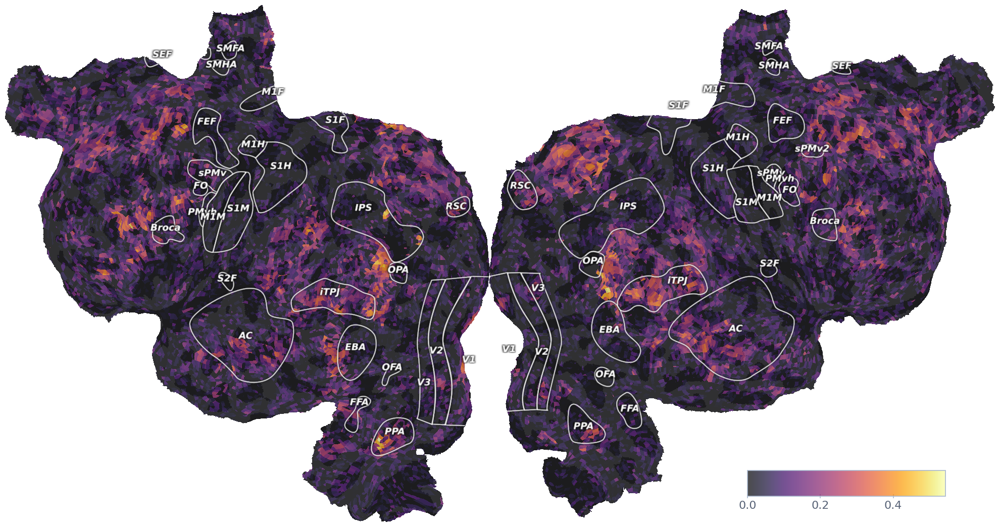

In [37]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

13


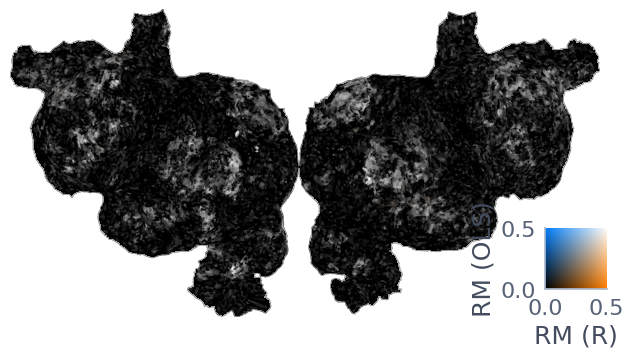

In [38]:
from matplotlib.ticker import FormatStrFormatter

fig, ax = plt.subplots(1, 1, figsize=(8, 4))

ax.axis('off')

vmin = 0
vmax = max(residual_ridge_correlation.max(), residual_correlation.max())
plot_2d_flatmap_from_mapper(residual_ridge_correlation, residual_correlation, mapper_path, vmin=vmin, vmax=vmax,
                            vmin2=vmin,
                            vmax2=vmax, alpha=1, label_1='RM (R)', label_2="RM (OLS)", ax=ax, with_rois=False,
                            colorbar_location=[0.86, 0.09, 0.2, 0.2])
# get child axis
children = ax.get_children()
print(len(children))
cbar = children[11]
# set formatter
cbar.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
cbar.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

13
13
13


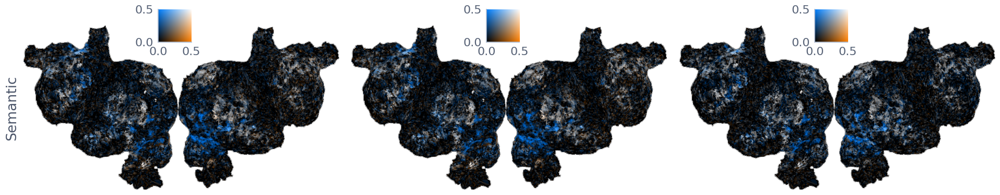

In [39]:
from matplotlib.ticker import FormatStrFormatter

figsize = np.array(flatmap_mask.shape) / 100.
fig, axs = plt.subplots(1, 3, figsize=figsize)

vmin = 0
vmax = max(np.nan_to_num(vp_correlation).max(), residual_correlation.max())
for i, (ax, corr, name) in enumerate(
        zip(axs, [residual_ridge_correlation, residual_correlation, vp_correlation],
            ["Residual Method (Ridge)", "Residual Method (OLS)", "Variance Partitioning"])):
    plot_2d_flatmap_from_mapper(corr, semantic_correlation, mapper_path, vmin=vmin, vmax=vmax, vmin2=vmin,
                                vmax2=vmax, alpha=1, label_1="", label_2="", ax=ax, with_rois=False,
                                colorbar_location=[0.38, 0.9, 0.2, 0.2])

    ax.axis('off')
    ax.set_xlabel(name)

    # get child axis
    children = ax.get_children()
    print(len(children))
    cbar = children[11]
    # set formatter
    cbar.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    cbar.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
fig.supylabel("Semantic")
plt.tight_layout()

# Plot visual cortex side by side

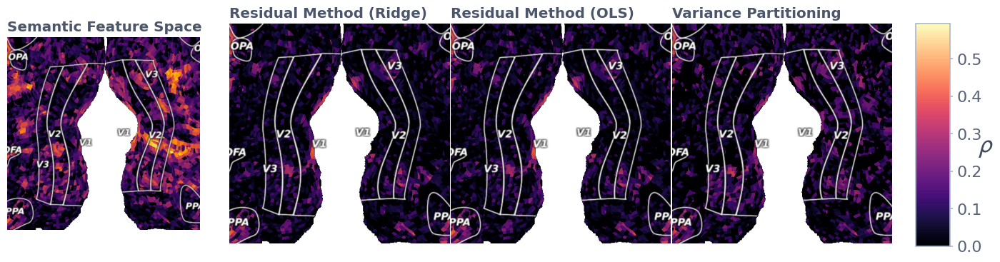

In [74]:
viewport_size = 400
gs_semantic = plt.GridSpec(1, 4)
gs_methods = plt.GridSpec(1, 4, wspace=0)
fig = plt.figure(figsize=(viewport_size / 100 * 4, viewport_size / 100))


def prep_ax(ax, name):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])  # Remove x ticks
    ax.set_yticks([])  # Remove y ticks
    ax.set_xlim([hcenter - viewport_size / 2, hcenter + viewport_size / 2])
    ax.set_ylim([vcenter + viewport_size / 2, vcenter - viewport_size / 2])
    ax.set_title(name, fontsize=viewport_size / 28)


cmap = 'magma'
alpha = 1
width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2 - 25
vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max(),
           residual_ridge_correlation.max())

semantic_ax = plt.subplot(gs_semantic[0, 0])
# plot_flatmap_from_mapper(semantic_correlation, mapper_path, ax=semantic_ax, vmin=0, vmax=vmax, with_colorbar=False, alpha=1)
# prep_ax(semantic_ax, "Semantic Feature Space")

ax = fig.add_subplot(gs_methods[0, 1])
other_axes = [fig.add_subplot(gs_methods[0, i], sharey=ax) for i in range(2, 4)]
method_axes = [ax] + other_axes
axs = [semantic_ax] + method_axes

for ax, corr, name in zip(axs, [semantic_correlation, residual_ridge_correlation, residual_correlation, vp_correlation],
                          ["Semantic Feature Space", "Residual Method (Ridge)", "Residual Method (OLS)",
                           "Variance Partitioning"]):
    plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, alpha=1)
    prep_ax(ax, name)
cbar_ax = fig.add_axes((0.92, 0.1, .03, 0.78))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
# cbar.ax.set_title(r"$\rho$", fontsize=26)
cbar.set_label(r"$\rho$", fontsize=26,
               rotation='horizontal')


/tmp/ipykernel_9272/860394914.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


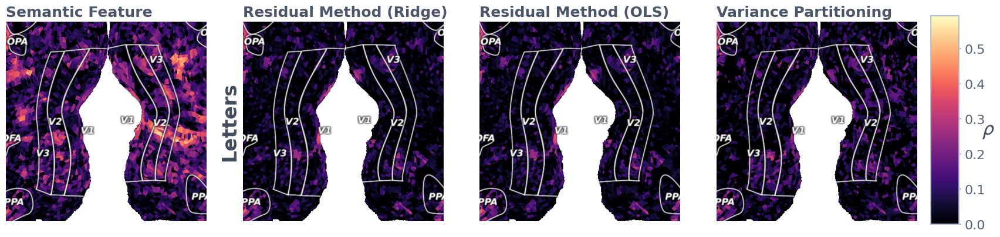

In [41]:
viewport_size = 400
fig, axs = plt.subplots(1, 4, figsize=(viewport_size / 100 * 4, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max(),
           residual_ridge_correlation.max())

cmap = 'magma'
alpha = 1
width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2 - 25

for i, (corr, name) in enumerate(
        zip([semantic_correlation, residual_ridge_correlation, residual_correlation, vp_correlation],
            ["Semantic Feature", "Residual Method (Ridge)", "Residual Method (OLS)", "Variance Partitioning"])):
    ax = axs[i]

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])  # Remove x ticks
    ax.set_yticks([])  # Remove y ticks
    ax.set_xlim([hcenter - viewport_size / 2, hcenter + viewport_size / 2])
    ax.set_ylim([vcenter + viewport_size / 2, vcenter - viewport_size / 2])
    ax.set_title(name)
    plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap, alpha=alpha)

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
# cbar.ax.set_title(r"$\rho$", fontsize=26)
cbar.set_label(r"$\rho$", fontsize=26,
               rotation='horizontal')

axs[1].set_ylabel(get_pretty_feature_name(low_level_feature), weight='bold', fontsize=24)
plt.tight_layout()
plt.show()

# Plot auditory cortex side-by-side

/tmp/ipykernel_9272/2342637945.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


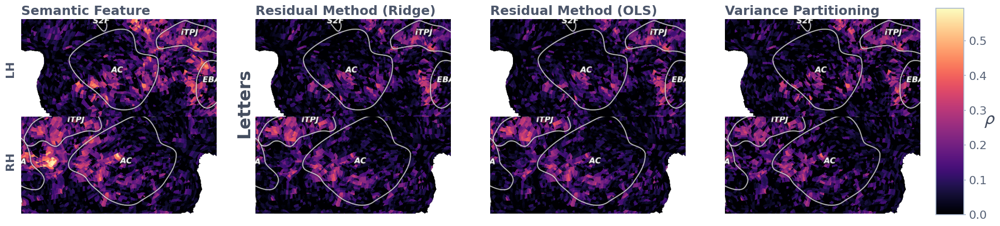

In [42]:
viewport_size = 450
fig, axs = plt.subplots(2, 4, figsize=(viewport_size / 100 * 4, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max(),
           residual_ridge_correlation.max())

cmap = 'magma'
alpha = 1

width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

left_ac = hcenter - 500
right_ac = hcenter + 450
vac = 650

for row, ac in enumerate([left_ac, right_ac]):
    for col, (corr, name) in enumerate(
            zip([semantic_correlation, residual_ridge_correlation, residual_correlation, vp_correlation],
                ["Semantic Feature", "Residual Method (Ridge)", "Residual Method (OLS)", "Variance Partitioning"])):
        ax = axs[row, col]

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks

        ax.set_xlim([ac - viewport_size / 2, ac + viewport_size / 2])
        ax.set_ylim([vac + viewport_size / 4, vac - viewport_size / 4])

        if row == 0:
            ax.set_title(name)

        plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap,
                                 alpha=alpha)

fig.text(0, .65, "LH", rotation=90, horizontalalignment='left', weight='bold')
fig.text(0, .25, "RH", rotation=90, horizontalalignment='left', weight='bold')

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
cbar.set_label(r"$\rho$", fontsize=26, rotation='horizontal', loc='center')

axs[0, 1].set_ylabel(get_pretty_feature_name(low_level_feature), weight='bold', fontsize=24, ha="right")
plt.tight_layout()
plt.subplots_adjust(hspace=0)
plt.show()